# Image Classification

In [54]:
import keras
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, ZeroPadding2D, Conv2D, BatchNormalization, Activation, MaxPooling2D, Add, AveragePooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
import math
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

import os
import numpy as np
import matplotlib.pyplot as plt

In [23]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)

path = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

In [24]:
train_dir = os.path.join(path, 'train')
validation_dir = os.path.join(path, 'validation')
print(train_dir)
print(validation_dir)

/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/train
/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/validation


In [25]:
# directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats') 
print(train_cats_dir)

# directory with our training dog pictures 
train_dogs_dir = os.path.join(train_dir, 'dogs')  
print(train_dogs_dir)

# directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')  
print(validation_cats_dir)

# directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')  
print(validation_dogs_dir)

/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/train/cats
/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/train/dogs
/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/validation/cats
/Users/yangdong-yeong/.keras/datasets/cats_and_dogs_filtered/validation/dogs


In [26]:
num_cats_tr = len(os.listdir(train_cats_dir))
print('total training cat images:', num_cats_tr)
num_dogs_tr = len(os.listdir(train_dogs_dir))
print('total training dog images:', num_dogs_tr)

print("--")

num_cats_val = len(os.listdir(validation_cats_dir))
print('total validation cat images:', num_cats_val)
num_dogs_val = len(os.listdir(validation_dogs_dir))
print('total validation dog images:', num_dogs_val)

print("--")

total_train = num_cats_tr + num_dogs_tr
print("Total training images:", total_train)
total_val = num_cats_val + num_dogs_val
print("Total validation images:", total_val)

total training cat images: 1000
total training dog images: 1000
--
total validation cat images: 500
total validation dog images: 500
--
Total training images: 2000
Total validation images: 1000


In [27]:
# parameter Initialization
batch_size = 32
epochs = 20
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [28]:
# 데이터를 시각화하기 위한 함수
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 5, figsize=(10,10))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

In [29]:
# Training data generator
image_gen_train = ImageDataGenerator(rescale=1./255,
                                     rotation_range=0.3,
                                     width_shift_range=0.1,
                                     height_shift_range=0.1,
                                     zoom_range=0.2,
                                     horizontal_flip=True, 
                                     vertical_flip=False)

In [30]:
train_data_gen = image_gen_train.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     shuffle=True,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='binary')

Found 2000 images belonging to 2 classes.


In [31]:
train_data_gen[0][0].shape

(32, 256, 256, 3)

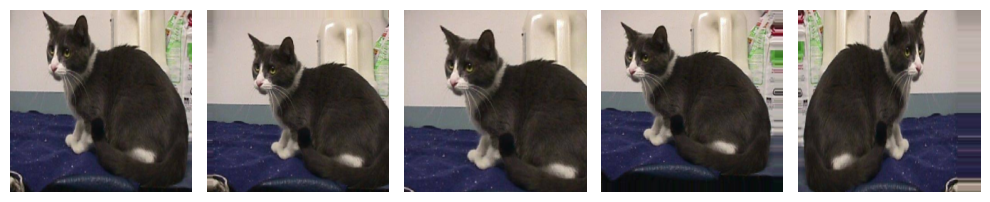

In [32]:
augmented_images = [train_data_gen[0][0][0] for i in range(5)]
plotImages(augmented_images)

In [33]:
# Validation data generator
image_gen_val = ImageDataGenerator(rescale=1./255)

In [34]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


In [35]:
val_data_gen = image_gen_val.flow_from_directory(batch_size=batch_size,
                                                 directory=validation_dir,
                                                 target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                 class_mode='binary')

Found 1000 images belonging to 2 classes.


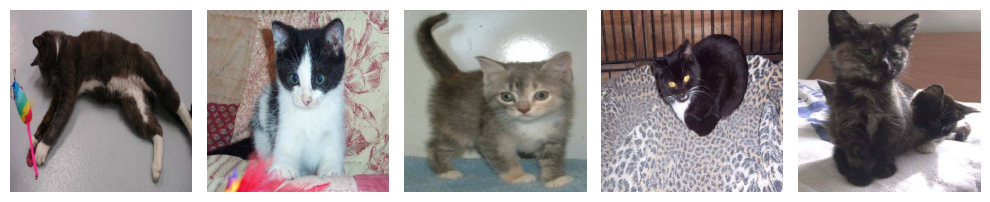

In [36]:
sample_training_images, _ = next(val_data_gen)
plotImages(sample_training_images[:5])

In [37]:
_[:5] # 정답 데이터

array([0., 0., 0., 0., 0.], dtype=float32)

## Modeling

In [38]:
def baseline_model(input_shape):
    
    input_layer = layers.Input(shape=input_shape)  # Adjusted to typical input size for VGGNet

    # First block
    x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
    x = tf.keras.layers.Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
    x=tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPool2D((2, 2))(x)

    # Second block
    x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
    x=tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPool2D((2, 2))(x)

    # Third block
    x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)

    x=tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPool2D((2, 2))(x)

    # Fourth block
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x=tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPool2D((2, 2))(x)

    # Fifth block
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = tf.keras.layers.Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x=tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.MaxPool2D((2, 2))(x)

    # Flattening before passing to the fully connected layers
    x = tf.keras.layers.Flatten()(x)

    # Fully connected layers
    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)

    # Output layer
    out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Adjusted to typical output size for VGGNet

    # Create the model
    model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
    return model

In [53]:
def improved_baseline_model(input_shape):
    input_layer = Input(shape=input_shape)

    # Convolutional blocks with explicit stride and padding settings
    x = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(input_layer)
    x = Conv2D(64, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(128, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(256, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = Conv2D(512, (3, 3), strides=1, activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x)

    # Fully connected layers with Dropout
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(4096, activation='relu')(x)
    x = Dropout(0.5)(x)

    # Output layer
    
    out_layer = Dense(1, activation='sigmoid')(x)

    model = tf.keras.Model(inputs=[input_layer], outputs=[out_layer])
    return model


In [39]:
def Pre_Trained_Model(input_shape):
    base_model = tf.keras.applications.VGG16(input_shape=input_shape,
                                             include_top=False,
                                             weights='imagenet')
    base_model.trainable = False  # Freeze the base model
    x = base_model.output
    x = tf.keras.layers.Flatten()(x)

    x = tf.keras.layers.Dense(4096, activation='relu')(x)
    x = tf.keras.layers.Dense(4096, activation='relu')(x)

    # Output layer
    out_layer = tf.keras.layers.Dense(1, activation='sigmoid')(x)  # Adjusted to typical output size for VGGNet

    # Create the model
    model = tf.keras.Model(inputs=[base_model.input], outputs=[out_layer])
    return model

In [40]:
def identity_block(X, f, filters):
    F1, F2, F3 = filters
    
    X_shortcut = X
    
    # 첫 번째 컴포넌트
    X = Conv2D(filters=F1, kernel_size=(1, 1), strides=(1, 1), padding='valid')(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    
    # 두 번째 컴포넌트
    X = Conv2D(filters=F2, kernel_size=(f, f), strides=(1, 1), padding='same')(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)

    # 세 번째 컴포넌트
    X = Conv2D(filters=F3, kernel_size=(1, 1), strides=(1, 1), padding='valid')(X)
    X = BatchNormalization(axis=3)(X)

    # 최종 단계: Shortcut과 입력을 더함
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    return X

def convolutional_block(X, f, filters, s=2):
    F1, F2, F3 = filters
    
    X_shortcut = X
    
    # 첫 번째 컴포넌트
    X = Conv2D(F1, (1, 1), strides=(s, s))(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    
    # 두 번째 컴포넌트
    X = Conv2D(F2, (f, f), strides=(1, 1), padding='same')(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)

    # 세 번째 컴포넌트
    X = Conv2D(F3, (1, 1), strides=(1, 1), padding='valid')(X)
    X = BatchNormalization(axis=3)(X)
    
    # Shortcut 경로
    X_shortcut = Conv2D(F3, (1, 1), strides=(s, s), padding='valid')(X_shortcut)
    X_shortcut = BatchNormalization(axis=3)(X_shortcut)

    # 최종 단계
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    return X

def ResNet50(input_shape=(256, 256, 3), classes=1):
    X_input = Input(input_shape)

    X = ZeroPadding2D((3, 3))(X_input)
    
    X = Conv2D(64, (7, 7), strides=(2, 2))(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    X = convolutional_block(X, f=3, filters=[64, 64, 256], s=1)
    X = identity_block(X, 3, [64, 64, 256])
    X = identity_block(X, 3, [64, 64, 256])

    X = convolutional_block(X, f=3, filters=[128, 128, 512])
    X = identity_block(X, 3, [128, 128, 512])
    X = identity_block(X, 3, [128, 128, 512])
    X = identity_block(X, 3, [128, 128, 512])

    X = convolutional_block(X, f=3, filters=[256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])
    X = identity_block(X, 3, [256, 256, 1024])

    X = convolutional_block(X, f=3, filters=[512, 512, 2048])
    X = identity_block(X, 3, [512, 512, 2048])
    X = identity_block(X, 3, [512, 512, 2048])

    X = AveragePooling2D(pool_size=(2, 2), padding='same')(X)
    
    X = Flatten()(X)
    X = Dense(classes, activation='sigmoid')(X)
    
    model = Model(inputs=X_input, outputs=X, name='ResNet50')

    return model


### Baseline(VGG16)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_106 (Conv2D)         (None, 256, 256, 64)      1792      
                                                                 
 conv2d_107 (Conv2D)         (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_106 (B  (None, 256, 256, 64)      256       
 atchNormalization)                                              
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 128, 128, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_108 (Conv2D)         (None, 128, 128, 128)     7385

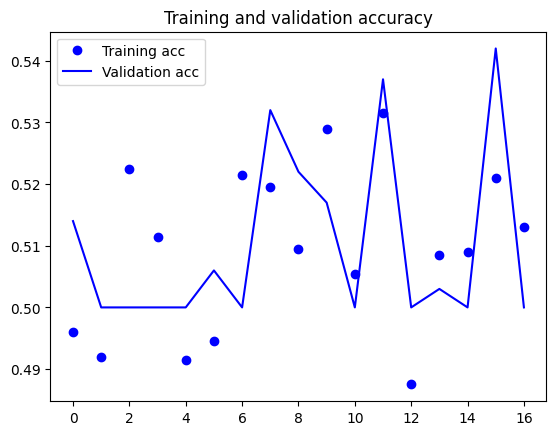

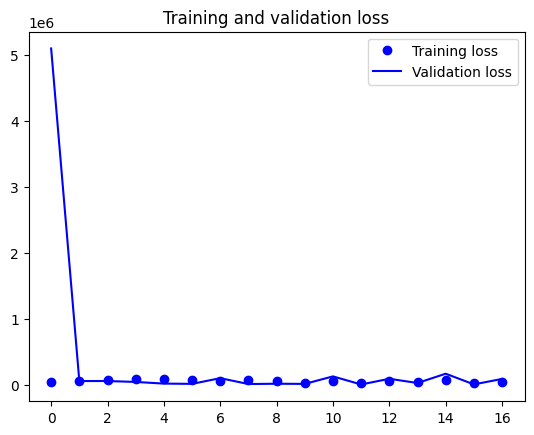

In [44]:
model = baseline_model((256, 256, 3))
model.summary()

# ModelCheckpoint 콜백 설정
checkpoint_cb = ModelCheckpoint(
    "best_model_improved.keras",  # 모델 파일 경로
    save_best_only=True)  # 가장 좋은 모델만 저장

# EarlyStopping 콜백 설정
early_stopping_cb = EarlyStopping(
    patience=5,  # 성능 향상을 위한 에포크 허용치
    restore_best_weights=True)  # 가장 좋은 가중치로 복원


# Compile the model with the legacy optimizer
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

baseline_model_history = model.fit(
      train_data_gen,
      steps_per_epoch=math.ceil((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size),
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=[checkpoint_cb, early_stopping_cb],
      validation_freq=1)

baseline_acc = baseline_model_history.history['binary_accuracy']
baseline_val_acc = baseline_model_history.history['val_binary_accuracy']
baseline_loss = baseline_model_history.history['loss']
baseline_val_loss = baseline_model_history.history['val_loss']

epochs_range = range(len(baseline_acc))

plt.plot(epochs_range, baseline_acc, 'bo', label='Training acc')
plt.plot(epochs_range, baseline_val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, baseline_loss, 'bo', label='Training loss')
plt.plot(epochs_range, baseline_val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### Transfer Learning(VGG16)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

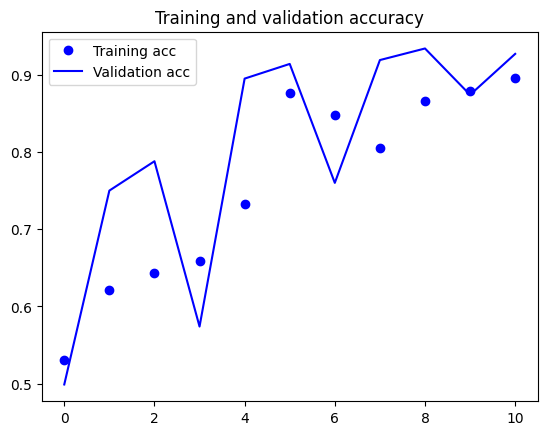

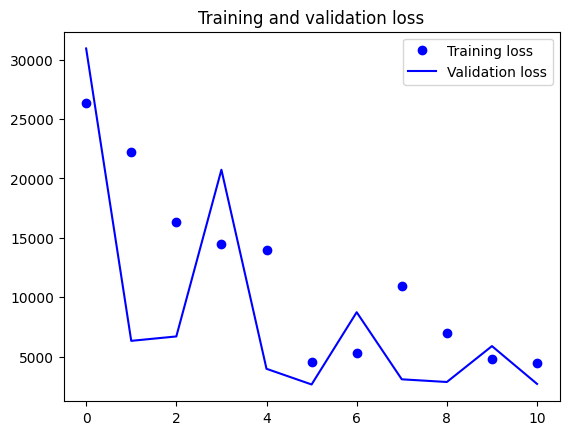

In [41]:
model = Pre_Trained_Model((256, 256, 3))
model.summary()

# ModelCheckpoint 콜백 설정
checkpoint_cb = ModelCheckpoint(
    "best_model_improved.keras",  # 모델 파일 경로
    save_best_only=True)  # 가장 좋은 모델만 저장

# EarlyStopping 콜백 설정
early_stopping_cb = EarlyStopping(
    patience=5,  # 성능 향상을 위한 에포크 허용치
    restore_best_weights=True)  # 가장 좋은 가중치로 복원


# Compile the model with the legacy optimizer
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

pre_trained_model_history = model.fit(
      train_data_gen,
      steps_per_epoch=math.ceil((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size),
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=[checkpoint_cb, early_stopping_cb],
      validation_freq=1)

pre_trained_acc = pre_trained_model_history.history['binary_accuracy']
pre_trained_val_acc = pre_trained_model_history.history['val_binary_accuracy']
pre_trained_loss = pre_trained_model_history.history['loss']
pre_trained_val_loss = pre_trained_model_history.history['val_loss']

epochs_range = range(len(pre_trained_acc))

plt.plot(epochs_range, pre_trained_acc, 'bo', label='Training acc')
plt.plot(epochs_range, pre_trained_val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, pre_trained_loss, 'bo', label='Training loss')
plt.plot(epochs_range, pre_trained_val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### Skip Connection (ResNet50)

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 zero_padding2d_1 (ZeroPadd  (None, 262, 262, 3)          0         ['input_4[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv2d_53 (Conv2D)          (None, 128, 128, 64)         9472      ['zero_padding2d_1[0][0]']    
                                                                                                  
 batch_normalization_53 (Ba  (None, 128, 128, 64)         256       ['conv2d_53[0][0]']    

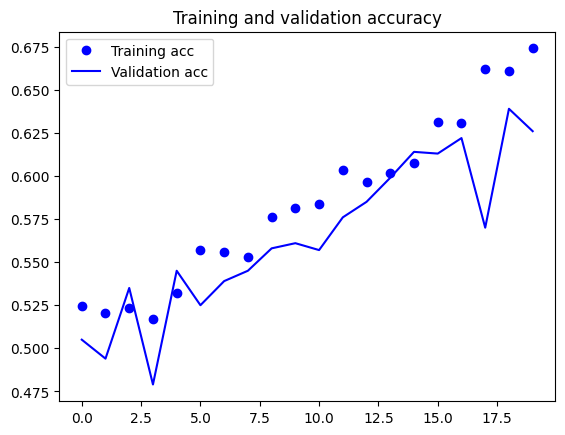

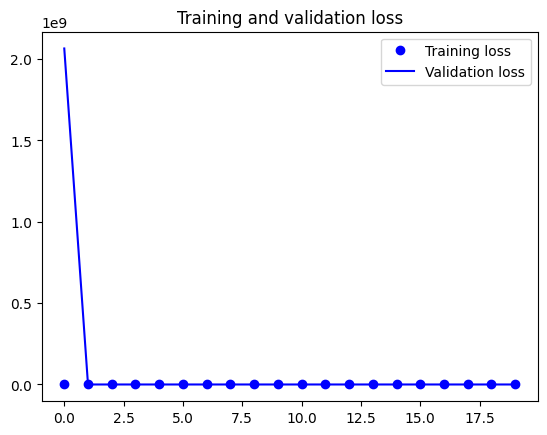

In [43]:
model = ResNet50((256, 256, 3))
model.summary()

# ModelCheckpoint 콜백 설정
checkpoint_cb = ModelCheckpoint(
    "best_model_improved.keras",  # 모델 파일 경로
    save_best_only=True)  # 가장 좋은 모델만 저장

# EarlyStopping 콜백 설정
early_stopping_cb = EarlyStopping(
    patience=5,  # 성능 향상을 위한 에포크 허용치
    restore_best_weights=True)  # 가장 좋은 가중치로 복원


# Compile the model with the legacy optimizer
loss_function=tf.keras.losses.binary_crossentropy
optimize=tf.keras.optimizers.legacy.Adam(learning_rate=0.01)
metric=tf.keras.metrics.binary_accuracy
model.compile(loss=loss_function,
              optimizer=optimize,
              metrics=[metric])

ResNet50_history = model.fit(
      train_data_gen,
      steps_per_epoch=math.ceil((len(os.listdir(train_cats_dir)) + len(os.listdir(train_dogs_dir)))/batch_size),
      epochs=epochs,
      validation_data=val_data_gen,
      callbacks=[checkpoint_cb, early_stopping_cb],
      validation_freq=1)

ResNet50_acc = ResNet50_history.history['binary_accuracy']
ResNet50_val_acc = ResNet50_history.history['val_binary_accuracy']
ResNet50_loss = ResNet50_history.history['loss']
ResNet50_val_loss = ResNet50_history.history['val_loss']

epochs_range = range(len(ResNet50_acc))

plt.plot(epochs_range, ResNet50_acc, 'bo', label='Training acc')
plt.plot(epochs_range, ResNet50_val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs_range, ResNet50_loss, 'bo', label='Training loss')
plt.plot(epochs_range, ResNet50_val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Object Detection

In [26]:
#!pip3 install tensorflow-estimator==2.6.0

  Using cached tensorflow_estimator-2.6.0-py2.py3-none-any.whl.metadata (1.2 kB)
Using cached tensorflow_estimator-2.6.0-py2.py3-none-any.whl (462 kB)


In [123]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile 
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

## Faster R-CNN

In [144]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [145]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 읽기
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.Resampling.LANCZOS) # 이미지 조정
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [146]:
def draw_bounding_box_on_image(image, ymin, xmin, ymax, xmax, color, font, thickness=4, display_str_list=()):
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)

  # Draw bounding box outline
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top), (left, top)], width=thickness, fill=color)

  # Estimate text height based on font properties (adjust as needed)
  estimated_text_height = font.size  # Use font.size for estimation

  for display_str in display_str_list[::-1]:
      # Estimate text width based on font properties (adjust as needed)
      estimated_text_width = draw.textlength(display_str, font=font)  # Use textlength for estimation

      # Use estimated height and width for positioning
      text_bottom = top if top > estimated_text_height else top + estimated_text_height
      draw.rectangle([(left, text_bottom - estimated_text_height - 2), (left + estimated_text_width, text_bottom)], fill=color)
      draw.text((left + 2, text_bottom - estimated_text_height - 1), display_str, fill="black", font=font)
      text_bottom -= estimated_text_height - 2  # Adjust for next text placement


In [147]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf", 25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /var/folders/h0/rz02629x2b535_x0qf1h70zm0000gn/T/tmp0276m15j.jpg.


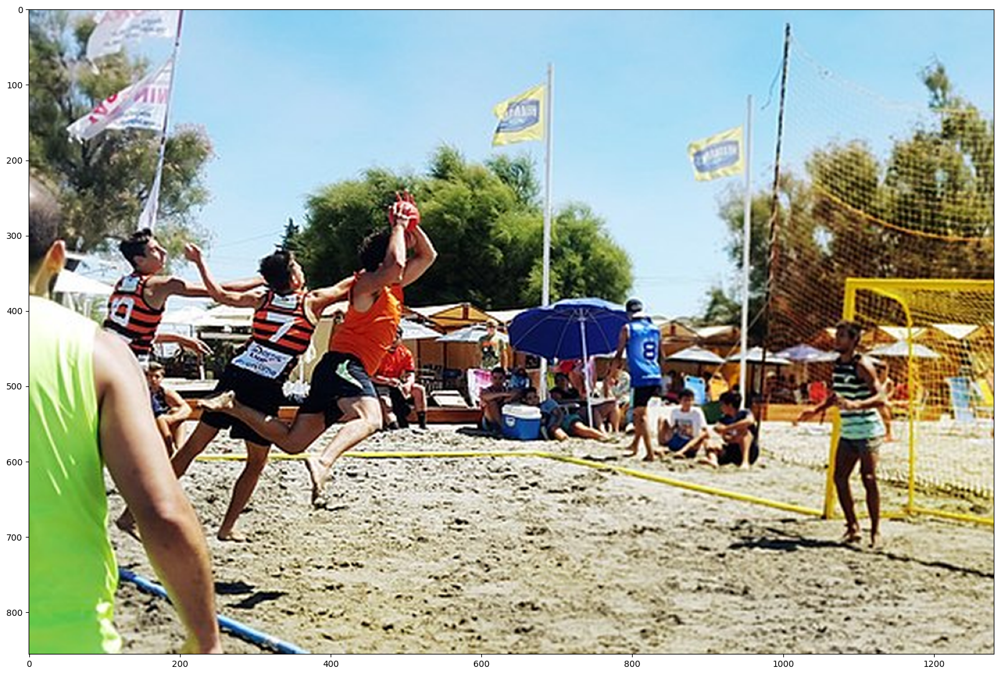

In [148]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [149]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [150]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [151]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

W0000 00:00:1710659525.931565 1284134 op_level_cost_estimator.cc:699] Error in PredictCost() for the op: op: "CropAndResize" attr { key: "T" value { type: DT_FLOAT } } attr { key: "extrapolation_value" value { f: 0 } } attr { key: "method" value { s: "bilinear" } } inputs { dtype: DT_FLOAT shape { dim { size: -2484 } dim { size: -2485 } dim { size: -2486 } dim { size: 1088 } } } inputs { dtype: DT_FLOAT shape { dim { size: -105 } dim { size: 4 } } } inputs { dtype: DT_INT32 shape { dim { size: -105 } } } inputs { dtype: DT_INT32 shape { dim { size: 2 } } value { dtype: DT_INT32 tensor_shape { dim { size: 2 } } int_val: 17 } } device { type: "CPU" model: "0" frequency: 2400 num_cores: 10 environment { key: "cpu_instruction_set" value: "ARM NEON" } environment { key: "eigen" value: "3.4.90" } l1_cache_size: 16384 l2_cache_size: 524288 l3_cache_size: 524288 memory_size: 268435456 } outputs { dtype: DT_FLOAT shape { dim { size: -105 } dim { size: 17 } dim { size: 17 } dim { size: 1088 } } 

Found 100 objects.
Inference time:  17.746249198913574
Font not found, using default font.


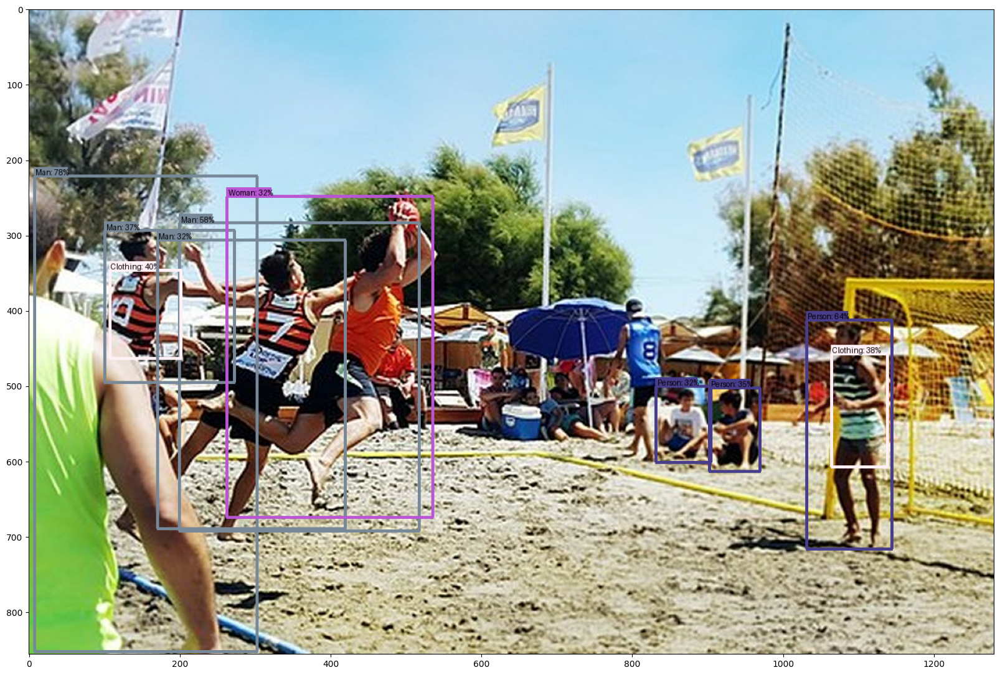

In [152]:
run_detector(detector, downloaded_image_path)

### Attempt with other image

Image downloaded to /var/folders/h0/rz02629x2b535_x0qf1h70zm0000gn/T/tmp0mw6rzjp.jpg.


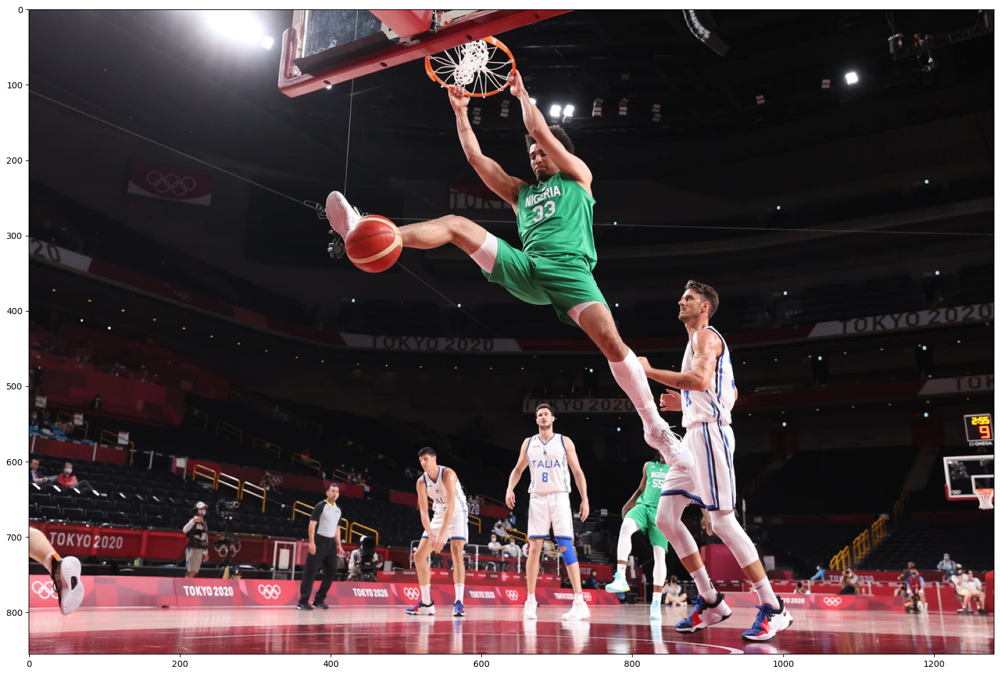

In [153]:
image_url = "https://img.olympics.com/images/image/private/t_16-9_3200/f_auto/v1538355600/primary/lskxfglroltzysq1vmwd"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True) 

Found 100 objects.
Inference time:  4.241853952407837
Font not found, using default font.


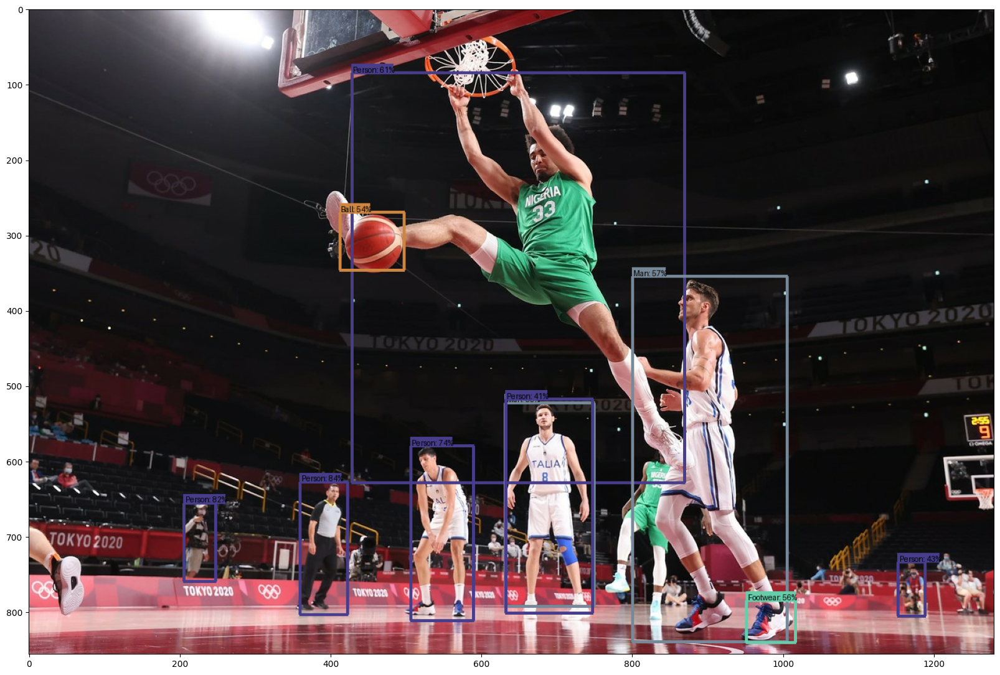

In [154]:
run_detector(detector, downloaded_image_path)

In [188]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.pt')

results = model.predict(source='/Users/yangdong-yeong/Desktop/프로젝트/lskxfglroltzysq1vmwd.jpg', save=True)


image 1/1 /Users/yangdong-yeong/Desktop/프로젝트/lskxfglroltzysq1vmwd.jpg: 384x640 10 persons, 1 tennis racket, 55.1ms
Speed: 2.4ms preprocess, 55.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict3


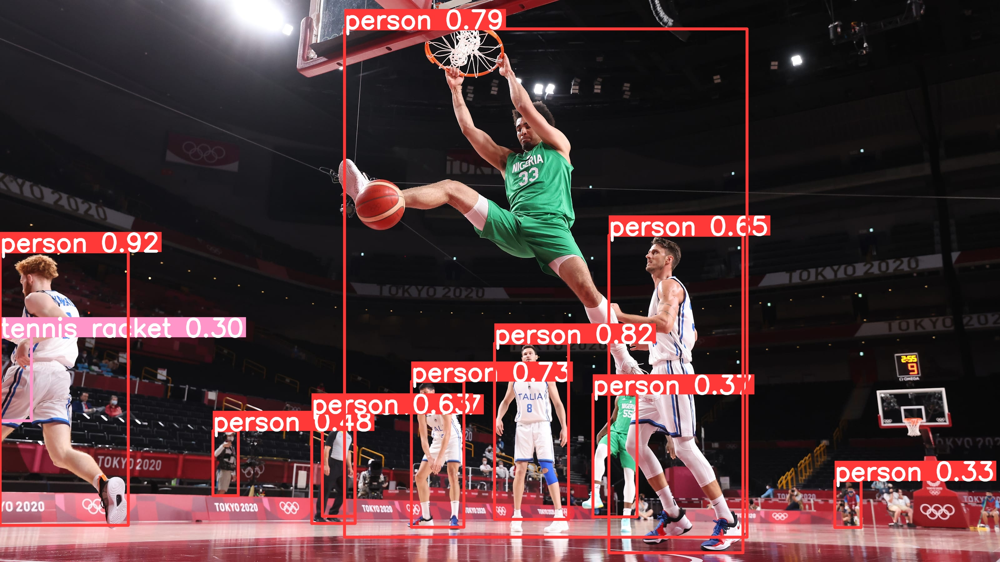

In [191]:
Image.open('/Users/yangdong-yeong/Desktop/프로젝트/runs/detect/predict3/lskxfglroltzysq1vmwd.jpg')

In [193]:
results = model.predict(source='https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg', save=True)

100.0%

image 1/1 /Users/yangdong-yeong/Desktop/프로젝트/640px-Torneo_beach_handball.jpg: 384x640 8 persons, 1 horse, 3 umbrellas, 44.5ms
Speed: 0.9ms preprocess, 44.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict3


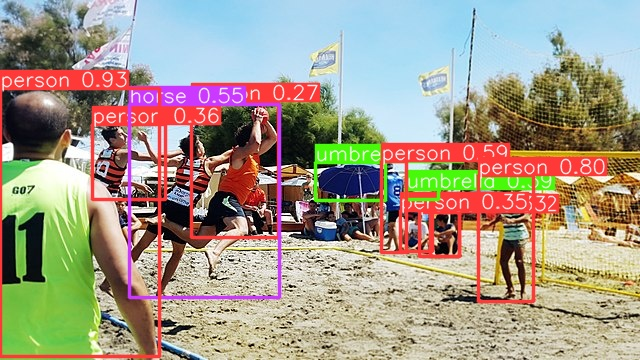

In [195]:
Image.open('/Users/yangdong-yeong/Desktop/프로젝트/runs/detect/predict3/Torneo_beach_handball.jpg')

# Retrospective

## Image classification

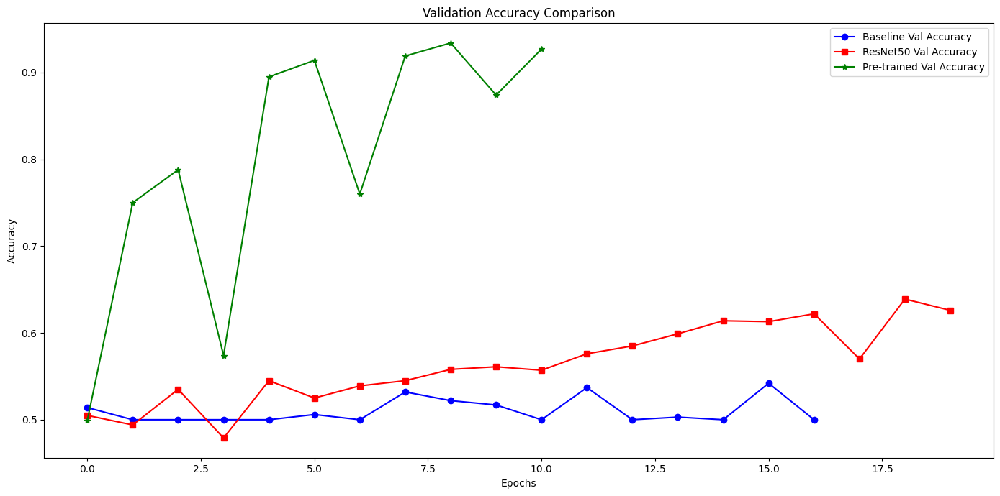

In [59]:
# Plot validation accuracy
plt.figure(figsize=(14, 7))
plt.plot(baseline_val_acc, 'bo-', label='Baseline Val Accuracy')
plt.plot(ResNet50_val_acc, 'rs-', label='ResNet50 Val Accuracy')
plt.plot(pre_trained_val_acc, 'g*-', label='Pre-trained Val Accuracy')
plt.title('Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

### 성능
1. Pre Trained VGG16
2. Skip Connection ResNet 
3. Baseline VGG16

모델 성능은 Pre Trained가 월등하게 높았지만 loss가 평균적으로 높았고 Epoch 별 Acc가 완만하지 않고 큰 편차가 있는 것으로 보여져 학습률을 조정하는 등 모델의 구조를 조금만 변경하면 더 좋아질 수 있을 것 같습니다. <br/>
ResNet50 구조 모델은 loss도 낮고 안정적이지만 Acc가 완만하게 상승하고 있어 Epoch를 조금 더 늘려보면 더 좋은 성능을 낼 수 있을 것으로 보여집니다.<br/>
Baseline은 Acc 0.5에서 큰 상승을 보이지 않고 loss도 점차 증가하고 있어 모델이 정상적으로 학습되고 있지 않은 것으로 보여집니다. <br/> 
<br/>
모델의 구조는 VGG16과 동일하게 만들었지만 실제 Transfer learning 된 모델의 layer를 확인하였을 때 배치가 다르게 구성되어 있어 자세한 내용은 논문을 참고하여 알아봐야 할 것 같습니다.
<br/>
처음 Transfer learning을 공부할 때 과적합 문제가 발생하더라도 자료가 적지 않다면 처음부터 학습을 시키는 것이 유리하지 않을까하는 생각했는데, 성능을 직접 체감해보고 시간적이나 비용적으로 상황에 따른 적합한 pre trained model을 모델을 사용하는게 훨씬 유리하다는 것을 느낄 수 있었습니다.
<br/>
예상외로 가장 힘들었던 부분은 맥북에서 tensorflow 사용 시 gpu가 사용되지 않아 metal로 gpu를 사용하도록 하는 과정에서 keras 버전이 keras 3으로 업그레이드되며 keras 2에서는 발생하지 않던 오류가 발생하여 시간이 오래 소요되는 문제가 있었는데,<br/>
버전문제를 해결하는게 가장 힘든 것 같습니다 ㅎㅎ,,


## Object Detection

Faster R-CNN과 YOLOv8을 사용해보았는데, <br/>
YOLO는 이렇게 간단해도 되나 싶을정도로 간편했고 둘다 사람에 대한 인식은 나쁘지 않았지만 Faster R-CNN은 정확도가 조금 더 높게 나온 것을 확인할 수 있었습니다.<br/>
예전에부터 영상 인식을 도전해보고 싶었는데 YOLO와 Transfomer를 조금 더 공부해서 도전해볼 예정입니다.